In [ ]:
# import
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
train=pd.read_csv("C:/Users/82102/Desktop/의료/128.치매 고위험군 라이프로그/128.치매 고위험군 라이프로그/01.데이터/train_data.csv")
val=pd.read_csv("C:/Users/82102/Desktop/의료/128.치매 고위험군 라이프로그/128.치매 고위험군 라이프로그/01.데이터/val_data.csv")

In [3]:
train.drop(columns=['Unnamed: 0'], inplace=True)
val.drop(columns=['Unnamed: 0'], inplace=True)

In [4]:
train.columns

Index(['EMAIL', 'activity_average_met', 'activity_cal_active',
       'activity_cal_total', 'activity_daily_movement', 'activity_day_end',
       'activity_day_start', 'activity_high', 'activity_inactive',
       'activity_inactivity_alerts', 'activity_low', 'activity_medium',
       'activity_met_min_high', 'activity_met_min_inactive',
       'activity_met_min_low', 'activity_met_min_medium', 'activity_non_wear',
       'activity_rest', 'activity_score', 'activity_score_meet_daily_targets',
       'activity_score_move_every_hour', 'activity_score_recovery_time',
       'activity_score_stay_active', 'activity_score_training_frequency',
       'activity_score_training_volume', 'activity_steps', 'activity_total',
       'CONVERT(activity_class_5min USING utf8)',
       'CONVERT(activity_met_1min USING utf8)', 'sleep_awake',
       'sleep_bedtime_end', 'sleep_bedtime_start', 'sleep_breath_average',
       'sleep_deep', 'sleep_duration', 'sleep_efficiency', 'sleep_hr_average',
       'slee

## 결측치 전혀 없음

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9705 entries, 0 to 9704
Data columns (total 98 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   EMAIL                                     9705 non-null   object 
 1   activity_average_met                      9705 non-null   float64
 2   activity_cal_active                       9705 non-null   int64  
 3   activity_cal_total                        9705 non-null   int64  
 4   activity_daily_movement                   9705 non-null   int64  
 5   activity_day_end                          9705 non-null   object 
 6   activity_day_start                        9705 non-null   object 
 7   activity_high                             9705 non-null   int64  
 8   activity_inactive                         9705 non-null   int64  
 9   activity_inactivity_alerts                9705 non-null   int64  
 10  activity_low                        

## 진단에 따른 인원 수와 비율 확인

(array([0, 1, 2]), [Text(0, 0, 'CN'), Text(1, 0, 'Dem'), Text(2, 0, 'MCI')])

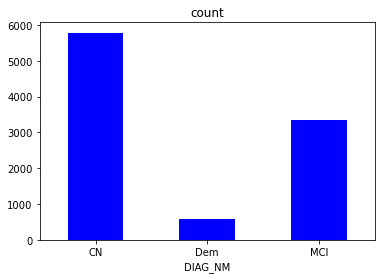

In [6]:
train.groupby('DIAG_NM').count()['EMAIL'].plot(kind='bar', color='blue')
plt.title("count")
plt.xticks(rotation=0)

([<matplotlib.patches.Wedge at 0x1fbbb3ffd90>,
 [Text(-0.3256642615332227, 1.0506868176388342, 'CN'),
  Text(-0.7773768281347193, -0.7782578410007851, 'Dem'),
  Text(0.5132193553350706, -0.9729367365401795, 'MCI')],
 [Text(-0.17763505174539418, 0.5731019005302732, '59.6%'),
  Text(-0.42402372443711955, -0.4245042769095191, '5.9%'),
  Text(0.2799378301827657, -0.5306927653855524, '34.5%')])

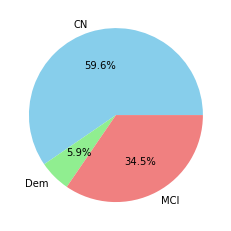

In [7]:
plt.pie(train.groupby('DIAG_NM').count()['EMAIL'], 
        labels=train.groupby('DIAG_NM').count()['EMAIL'].index,
        autopct='%1.1f%%', colors=['skyblue', 'lightgreen', 'lightcoral'])

## 정상 85, 경증 47, 치매 9명

In [8]:
train.groupby('DIAG_NM').nunique()['EMAIL']

DIAG_NM
CN     85
Dem     9
MCI    47
Name: EMAIL, dtype: int64

## 증상 별 나눠서 시계열 데이터 확인

In [9]:
CN_data=train[train['DIAG_NM']=='CN']
MCI_data=train[train['DIAG_NM']=='MCI']
Dem_data=train[train['DIAG_NM']=='Dem']
CN_data=CN_data.reset_index(drop=True)
MCI_data=MCI_data.reset_index(drop=True)
Dem_data=Dem_data.reset_index(drop=True)

In [10]:
CN_data

,EMAIL,activity_average_met,activity_cal_active,activity_cal_total,activity_daily_movement,activity_day_end,activity_day_start,activity_high,activity_inactive,activity_inactivity_alerts,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
0,nia+354@rowan.kr,1.59375,671,2786,13424,2020-10-31T03:59:59+09:00,2020-10-30T04:00:00+09:00,3,533,1,...,2,2,2,2,2,2,2,2,2,26
1,nia+354@rowan.kr,1.50000,493,2630,9470,2020-11-01T03:59:59+09:00,2020-10-31T04:00:00+09:00,0,463,0,...,2,2,2,2,2,2,2,2,2,26
2,nia+354@rowan.kr,1.65625,729,2878,14531,2020-11-03T03:59:59+09:00,2020-11-02T04:00:00+09:00,1,497,0,...,2,2,2,2,2,2,2,2,2,26
3,nia+354@rowan.kr,1.37500,333,2415,6119,2020-11-06T03:59:59+09:00,2020-11-05T04:00:00+09:00,0,486,1,...,2,2,2,2,2,2,2,2,2,26
4,nia+354@rowan.kr,1.43750,413,2507,7364,2020-11-07T03:59:59+09:00,2020-11-06T04:00:00+09:00,0,451,0,...,2,2,2,2,2,2,2,2,2,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5776,nia+206@rowan.kr,1.34375,249,2351,4411,2020-12-25T03:59:59+09:00,2020-12-24T04:00:00+09:00,1,780,4,...,2,2,2,2,2,2,1,2,2,28
5777,nia+206@rowan.kr,1.53125,570,2682,11057,2020-12-27T03:59:59+09:00,2020-12-26T04:00:00+09:00,1,518,1,...,2,2,2,2,2,2,1,2,2,28
5778,nia+206@rowan.kr,1.34375,295,2331,5135,2020-12-28T03:59:59+09:00,2020-12-27T04:00:00+09:00,4,578,0,...,2,2,2,2,2,2,1,2,2,28
5779,nia+206@rowan.kr,1.31250,186,2280,3178,2020-12-29T03:59:59+09:00,2020-12-28T04:00:00+09:00,0,778,1,...,2,2,2,2,2,2,1,2,2,28


## 환자에 따른 측정 일수도 차이가 남 -> 시계열 데이터 활용에 애매해짐

In [11]:
print(CN_data['EMAIL'].value_counts(),MCI_data['EMAIL'].value_counts(),Dem_data['EMAIL'].value_counts())

nia+039@rowan.kr    115
nia+005@rowan.kr    113
nia+289@rowan.kr    111
nia+342@rowan.kr    108
nia+078@rowan.kr    108
                   ... 
nia+397@rowan.kr     37
nia+398@rowan.kr     36
nia+394@rowan.kr     36
nia+445@rowan.kr     36
nia+015@rowan.kr     35
Name: EMAIL, Length: 85, dtype: int64 nia+068@rowan.kr    120
nia+265@rowan.kr    118
nia+059@rowan.kr    113
nia+131@rowan.kr    105
nia+043@rowan.kr     96
nia+069@rowan.kr     93
nia+153@rowan.kr     92
nia+106@rowan.kr     91
nia+252@rowan.kr     88
nia+213@rowan.kr     87
nia+135@rowan.kr     83
nia+083@rowan.kr     82
nia+154@rowan.kr     72
nia+283@rowan.kr     71
nia+126@rowan.kr     71
nia+037@rowan.kr     70
nia+284@rowan.kr     70
nia+204@rowan.kr     70
nia+155@rowan.kr     69
nia+336@rowan.kr     68
nia+144@rowan.kr     68
nia+014@rowan.kr     68
nia+046@rowan.kr     68
nia+044@rowan.kr     67
nia+291@rowan.kr     67
nia+016@rowan.kr     67
nia+238@rowan.kr     66
nia+171@rowan.kr     66
nia+066@rowan.kr     65
ni

# 치매인 환자부터 시계열 자료 확인

In [12]:
Dem_data

,EMAIL,activity_average_met,activity_cal_active,activity_cal_total,activity_daily_movement,activity_day_end,activity_day_start,activity_high,activity_inactive,activity_inactivity_alerts,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
0,nia+067@rowan.kr,1.43750,397,2472,7103,2020-10-19T03:59:59+09:00,2020-10-18T04:00:00+09:00,0,636,2,...,2,2,2,1,1,2,1,2,2,16
1,nia+067@rowan.kr,1.37500,366,2398,6881,2020-10-20T03:59:59+09:00,2020-10-19T04:00:00+09:00,0,586,2,...,2,2,2,1,1,2,1,2,2,16
2,nia+067@rowan.kr,1.34375,330,2354,6389,2020-10-21T03:59:59+09:00,2020-10-20T04:00:00+09:00,0,539,1,...,2,2,2,1,1,2,1,2,2,16
3,nia+067@rowan.kr,1.21875,92,2122,1159,2020-10-22T03:59:59+09:00,2020-10-21T04:00:00+09:00,0,647,0,...,2,2,2,1,1,2,1,2,2,16
4,nia+067@rowan.kr,1.25000,206,2188,3755,2020-10-23T03:59:59+09:00,2020-10-22T04:00:00+09:00,0,506,1,...,2,2,2,1,1,2,1,2,2,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,nia+196@rowan.kr,1.00000,14,1845,194,2021-01-02T03:59:59+09:00,2021-01-01T04:00:00+09:00,0,104,0,...,2,2,2,1,2,1,2,1,2,16
567,nia+196@rowan.kr,1.15625,71,2032,1090,2021-01-03T03:59:59+09:00,2021-01-02T04:00:00+09:00,0,581,1,...,2,2,2,1,2,1,2,1,2,16
568,nia+196@rowan.kr,1.21875,207,2162,3726,2021-01-04T03:59:59+09:00,2021-01-03T04:00:00+09:00,2,457,0,...,2,2,2,1,2,1,2,1,2,16
569,nia+196@rowan.kr,1.15625,122,2071,1974,2021-01-05T03:59:59+09:00,2021-01-04T04:00:00+09:00,0,507,0,...,2,2,2,1,2,1,2,1,2,16


In [13]:
# 환자 이메일
Dem_data['EMAIL'].unique()

array(['nia+067@rowan.kr', 'nia+341@rowan.kr', 'nia+338@rowan.kr',
       'nia+017@rowan.kr', 'nia+219@rowan.kr', 'nia+230@rowan.kr',
       'nia+139@rowan.kr', 'nia+306@rowan.kr', 'nia+196@rowan.kr'],
      dtype=object)

In [14]:
Dem_grouped_data = dict(tuple(Dem_data.groupby('EMAIL')))
Dem_example_email = ['nia+067@rowan.kr', 'nia+341@rowan.kr', 'nia+338@rowan.kr',
       'nia+017@rowan.kr', 'nia+219@rowan.kr', 'nia+230@rowan.kr',
       'nia+139@rowan.kr', 'nia+306@rowan.kr', 'nia+196@rowan.kr']
Dem_data0=Dem_grouped_data[Dem_example_email[0]]
Dem_data1=Dem_grouped_data[Dem_example_email[1]]
Dem_data2=Dem_grouped_data[Dem_example_email[2]]
Dem_data3=Dem_grouped_data[Dem_example_email[3]]
Dem_data4=Dem_grouped_data[Dem_example_email[4]]
Dem_data5=Dem_grouped_data[Dem_example_email[5]]
Dem_data6=Dem_grouped_data[Dem_example_email[6]]
Dem_data7=Dem_grouped_data[Dem_example_email[7]]
Dem_data8=Dem_grouped_data[Dem_example_email[8]]

# 치매 첫 번째 환자의 hypnogram을 측정된 기간을 모두 합친 데이터

In [15]:
Dem_data0['CONVERT(sleep_hypnogram_5min USING utf8)']
Dem_data0_concat = ''.join(Dem_data0['CONVERT(sleep_hypnogram_5min USING utf8)'])
Dem_data0_concat

'4/2/4/4/2/2/2/2/2/2/2/2/2/2/2/2/4/2/2/1/2/3/3/2/2/2/2/3/4/4/2/2/2/2/2/4/4/2/4/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/4/4/4/4/4/4/2/2/4/3/2/2/2/3/3/3/2/2/2/2/2/2/2/3/2/2/2/2/2/2/2/2/2/2/2/2/2/3/3/2/2/2/2/2/2/2/2/2/3/2/2/3/3/3/2/2/4/2/3/2/2/2/3/3/3/2/2/2/4/4/2/2/3/2/2/2/2/2/1/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/4/2/2/2/2/2/2/2/2/2/2/2/2/3/3/3/3/2/3/2/2/2/2/3/3/4/2/2/3/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/3/3/3/2/2/3/3/2/2/2/2/4/2/3/4/4/4/4/4/2/2/4/4/2/2/1/1/1/2/2/4/4/2/2/4/4/4/4/4/1/1/1/1/1/1/2/1/1/2/1/2/2/1/2/2/1/1/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/2/1/2/2/2/2/2/2/2/2/2/2/2/2/4/4/2/2/2/2/2/2/2/3/3/3/3/3/3/2/2/2/2/2/2/2/2/2/3/3/3/3/4/4/4/4/4/2/4/4/2/4/4/2/2/2/2/1/1/2/2/3/4/4/4/2/2/4/4/4/2/1/1/1/1/2/1/1/1/1/2/2/4/2/2/4/4/2/1/1/2/1/1/1/2/2/2/2/2/2/2/2/2/2/2/1/2/3/2/2/2/2/2/2/2/2/2/3/2/2/2/2/2/2/2/2/2/2/4/2/2/2/3/3/3/3/3/3/4/2/2/3/4/4/4/4/3/4/4/4/2/1/2/4/4/2/2/2/1/1/1/1/1/4/4/4/2/2/2/4/4/2/2/2/2/2/4/4/4/2/2/2/1/1/1/2/1/1/1/2/2/2/2/2/2/4/4/4/3/3/2/2/2/2/4/4/2/2/2/2/2/2/2/2/2/2/2/2/2

In [16]:
Dem_data0_ts = Dem_data0_concat.split('/')
Dem_data0_ts = [int(x) for x in Dem_data0_ts if x.strip()]
Dem_data0_ts

[4,
 2,
 4,
 4,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 4,
 2,
 2,
 1,
 2,
 3,
 3,
 2,
 2,
 2,
 2,
 3,
 4,
 4,
 2,
 2,
 2,
 2,
 2,
 4,
 4,
 2,
 4,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 4,
 4,
 4,
 4,
 4,
 4,
 2,
 2,
 4,
 3,
 2,
 2,
 2,
 3,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2,
 2,
 3,
 3,
 3,
 2,
 2,
 4,
 2,
 3,
 2,
 2,
 2,
 3,
 3,
 3,
 2,
 2,
 2,
 4,
 4,
 2,
 2,
 3,
 2,
 2,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 4,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 2,
 3,
 2,
 2,
 2,
 2,
 3,
 3,
 4,
 2,
 2,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 2,
 2,
 3,
 3,
 2,
 2,
 2,
 2,
 4,
 2,
 3,
 4,
 4,
 4,
 4,
 4,
 2,
 2,
 4,
 4,
 2,
 2,
 1,
 1,
 1,
 2,
 2,
 4,
 4,
 2,
 2,
 4,
 4,
 4,
 4,
 4,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 2,
 1,
 2,


# 최소 1달 ~ 4달의 데이터를 한 번에 합쳐서 확인하기에는 어려움이 있어보임

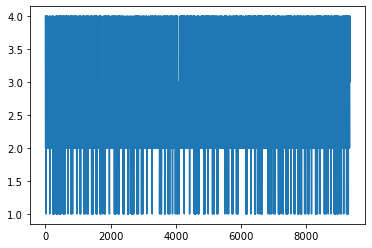

In [17]:
# 5분당 기록 -> 시계열이므로 대략 1달~3달 정도의 데이터가 있음
# 한 번에 이어붙이면 데이터 길이가 너무 길어져 그래프 확인하기가 어려움 
# 최대 하루 기준으로 비교해봐야 할 듯
plt.plot(Dem_data0_ts)

In [18]:
Dem_data0

,EMAIL,activity_average_met,activity_cal_active,activity_cal_total,activity_daily_movement,activity_day_end,activity_day_start,activity_high,activity_inactive,activity_inactivity_alerts,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
0,nia+067@rowan.kr,1.43750,397,2472,7103,2020-10-19T03:59:59+09:00,2020-10-18T04:00:00+09:00,0,636,2,...,2,2,2,1,1,2,1,2,2,16
1,nia+067@rowan.kr,1.37500,366,2398,6881,2020-10-20T03:59:59+09:00,2020-10-19T04:00:00+09:00,0,586,2,...,2,2,2,1,1,2,1,2,2,16
2,nia+067@rowan.kr,1.34375,330,2354,6389,2020-10-21T03:59:59+09:00,2020-10-20T04:00:00+09:00,0,539,1,...,2,2,2,1,1,2,1,2,2,16
3,nia+067@rowan.kr,1.21875,92,2122,1159,2020-10-22T03:59:59+09:00,2020-10-21T04:00:00+09:00,0,647,0,...,2,2,2,1,1,2,1,2,2,16
4,nia+067@rowan.kr,1.25000,206,2188,3755,2020-10-23T03:59:59+09:00,2020-10-22T04:00:00+09:00,0,506,1,...,2,2,2,1,1,2,1,2,2,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,nia+067@rowan.kr,1.18750,78,2091,908,2021-01-01T03:59:59+09:00,2020-12-31T04:00:00+09:00,0,754,2,...,2,2,2,1,1,2,1,2,2,16
71,nia+067@rowan.kr,1.21875,105,2119,1344,2021-01-02T03:59:59+09:00,2021-01-01T04:00:00+09:00,0,691,1,...,2,2,2,1,1,2,1,2,2,16
72,nia+067@rowan.kr,1.15625,64,2041,795,2021-01-03T03:59:59+09:00,2021-01-02T04:00:00+09:00,0,608,2,...,2,2,2,1,1,2,1,2,2,16
73,nia+067@rowan.kr,1.18750,83,2091,883,2021-01-05T03:59:59+09:00,2021-01-04T04:00:00+09:00,0,645,1,...,2,2,2,1,1,2,1,2,2,16


In [19]:
len(Dem_data0)

75

# 치매 환자의 하루 간 sleep_hypnogram 경향성

In [20]:
Dem_data0['CONVERT(sleep_hypnogram_5min USING utf8)']

0     4/2/4/4/2/2/2/2/2/2/2/2/2/2/2/2/4/2/2/1/2/3/3/...
1     4/2/2/3/2/2/2/2/2/1/2/2/2/2/2/2/2/2/2/2/2/2/2/...
2     4/4/4/2/2/4/4/2/2/1/1/1/2/2/4/4/2/2/4/4/4/4/4/...
3     4/4/4/2/4/4/2/4/4/2/2/2/2/1/1/2/2/3/4/4/4/2/2/...
4     4/2/1/2/4/4/2/2/2/1/1/1/1/1/4/4/4/2/2/2/4/4/2/...
                            ...                        
70    4/2/2/2/2/1/1/1/1/2/2/2/2/2/1/2/4/4/2/1/1/1/2/...
71    4/4/2/2/2/2/2/2/1/1/4/2/2/1/1/2/2/3/3/2/4/4/4/...
72    4/2/2/2/2/2/2/2/2/2/2/2/1/1/2/2/2/2/2/2/2/2/2/...
73    4/2/2/2/2/2/2/4/2/2/2/2/2/2/1/1/4/4/4/2/2/2/3/...
74    2/4/4/4/2/2/2/1/1/1/2/2/2/2/2/2/2/2/2/2/2/2/2/...
Name: CONVERT(sleep_hypnogram_5min USING utf8), Length: 75, dtype: object

In [21]:
Dem_data0_list = []

for i in range(len(Dem_data0)):
    sleep_hypnogram_data0 = Dem_data0.iloc[i]['CONVERT(sleep_hypnogram_5min USING utf8)'].split('/')
    sleep_hypnogram_data0 = [int(x) for x in sleep_hypnogram_data0 if x.strip()]
    Dem_data0_list.append(sleep_hypnogram_data0)

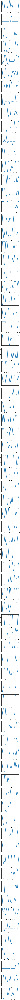

In [22]:
num_graphs_to_draw = len(Dem_data0)  # 그릴 그래프의 개수
fig, axs = plt.subplots(num_graphs_to_draw, 1, figsize=(8, 6*num_graphs_to_draw))  #subplot 생성

for idx, data in enumerate(Dem_data0_list[:num_graphs_to_draw]):
    axs[idx].plot(data)
    axs[idx].set_title(f'Graph {idx+1}')

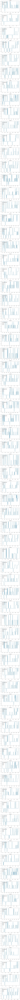

In [23]:
num_graphs_to_draw = len(Dem_data0_list)  # 그릴 그래프의 개수
fig, axs = plt.subplots(num_graphs_to_draw, 1, figsize=(8, 6*num_graphs_to_draw))  # subplot 생성

for idx, data in enumerate(Dem_data0_list):
    x_values = list(range(len(data)))  # x축의 길이
    axs[idx].plot(x_values, data)
    axs[idx].set_title(f'Graph {idx+1}')
    
    # 1과 3이 연속되는 횟수와 3과 1이 연속되는 횟수 구하기
    count_13 = 0
    count_31 = 0
    for i in range(len(data) - 1):
        if data[i] == 1 and data[i + 1] == 3:
            count_13 += 1
        elif data[i] == 3 and data[i + 1] == 1:
            count_31 += 1
    
    axs[idx].text(0.05, 0.9, f"X-axis length: {len(data)}", transform=axs[idx].transAxes, fontsize=12,
                  verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axs[idx].text(0.05, 0.8, f"1-3: {count_13}", transform=axs[idx].transAxes, fontsize=12,
                  verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    axs[idx].text(0.05, 0.7, f"3-1: {count_31}", transform=axs[idx].transAxes, fontsize=12,
                  verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

plt.show()  # 그래프 출력

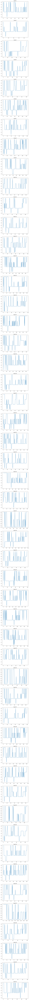

In [24]:
Dem_data1_list = []

# for 루프를 사용하여 데이터 처리
for i in range(len(Dem_data1)):
    sleep_hypnogram_data1 = Dem_data1.iloc[i]['CONVERT(sleep_hypnogram_5min USING utf8)'].split('/')
    sleep_hypnogram_data1 = [int(x) for x in sleep_hypnogram_data1 if x.strip()]
    Dem_data1_list.append(sleep_hypnogram_data1)
    
num_graphs_to_draw = len(Dem_data1)  # 그릴 그래프의 개수
fig, axs = plt.subplots(num_graphs_to_draw, 1, figsize=(8, 6*num_graphs_to_draw))  # 그래프 개수에 맞게 subplot 생성

for idx, data in enumerate(Dem_data0_list[:num_graphs_to_draw]):  # num_graphs_to_draw만큼 데이터를 선택하여 그래프 그리기
    axs[idx].plot(data)  # 데이터를 그래프로 그리기
    axs[idx].set_title(f'Graph {idx+1}')

# 일반 사람의 하루 간 sleep_hypnogram 경향성

In [25]:
CN_grouped_data = dict(tuple(CN_data.groupby('EMAIL')))
CN_example_email = CN_data['EMAIL'].unique()

In [26]:
CN_data0=CN_grouped_data[CN_example_email[0]]
CN_data1=CN_grouped_data[CN_example_email[1]]
CN_data2=CN_grouped_data[CN_example_email[2]]

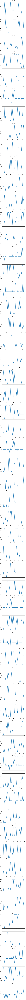

In [27]:
CN_data0_list = []

for i in range(len(CN_data0)):
    sleep_hypnogram_data = CN_data0.iloc[i]['CONVERT(sleep_hypnogram_5min USING utf8)'].split('/')
    sleep_hypnogram_data = [int(x) for x in sleep_hypnogram_data if x.strip()]
    CN_data0_list.append(sleep_hypnogram_data)

num_graphs_to_draw = len(CN_data0)  # 그릴 그래프의 개수
fig, axs = plt.subplots(num_graphs_to_draw, 1, figsize=(8, 6*num_graphs_to_draw))  #subplot 생성

for idx, data in enumerate(CN_data0_list[:num_graphs_to_draw]):
    axs[idx].plot(data)
    axs[idx].set_title(f'Graph {idx+1}')

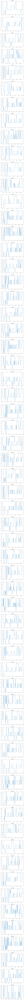

In [28]:
CN_data1_list = []

for i in range(len(CN_data1)):
    sleep_hypnogram_data = CN_data1.iloc[i]['CONVERT(sleep_hypnogram_5min USING utf8)'].split('/')
    sleep_hypnogram_data = [int(x) for x in sleep_hypnogram_data if x.strip()]
    CN_data1_list.append(sleep_hypnogram_data)

num_graphs_to_draw = len(CN_data1)  # 그릴 그래프의 개수
fig, axs = plt.subplots(num_graphs_to_draw, 1, figsize=(8, 6*num_graphs_to_draw))  #subplot 생성

for idx, data in enumerate(CN_data1_list[:num_graphs_to_draw]):
    axs[idx].plot(data)
    axs[idx].set_title(f'Graph {idx+1}')

# 진단별 렘 수면과 서파 수면의 시간

In [29]:
print(CN_data['sleep_rem'].mean(),MCI_data['sleep_rem'].mean(),Dem_data['sleep_rem'].mean())

3689.0814737934616 3574.053086787951 4160.542907180386


In [30]:
print(CN_data['sleep_deep'].mean(),MCI_data['sleep_deep'].mean(),Dem_data['sleep_deep'].mean())

5302.298910223145 4911.0259469132125 4232.364273204904


## 치매와 치매가 아닌 사람의 수면 상태 로그에 변화가 있는지 비교

## 솔직히 차이 잘 모르겠음

In [31]:
one_dem_data=Dem_data[Dem_data['EMAIL']=='nia+219@rowan.kr']
one_dem_data

,EMAIL,activity_average_met,activity_cal_active,activity_cal_total,activity_daily_movement,activity_day_end,activity_day_start,activity_high,activity_inactive,activity_inactivity_alerts,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
242,nia+219@rowan.kr,2.37500,1775,4074,35737,2020-10-24T03:59:59+09:00,2020-10-23T04:00:00+09:00,14,410,0,...,2,2,2,1,2,1,2,2,2,23
243,nia+219@rowan.kr,1.93750,1183,3379,24470,2020-10-25T03:59:59+09:00,2020-10-24T04:00:00+09:00,1,256,0,...,2,2,2,1,2,1,2,2,2,23
244,nia+219@rowan.kr,1.84375,975,3195,19132,2020-10-26T03:59:59+09:00,2020-10-25T04:00:00+09:00,2,254,0,...,2,2,2,1,2,1,2,2,2,23
245,nia+219@rowan.kr,2.53125,2151,4384,40916,2020-10-27T03:59:59+09:00,2020-10-26T04:00:00+09:00,71,331,1,...,2,2,2,1,2,1,2,2,2,23
246,nia+219@rowan.kr,2.00000,1305,3473,27562,2020-10-28T03:59:59+09:00,2020-10-27T04:00:00+09:00,1,240,0,...,2,2,2,1,2,1,2,2,2,23
247,nia+219@rowan.kr,2.37500,1790,4088,36806,2020-10-29T03:59:59+09:00,2020-10-28T04:00:00+09:00,9,388,0,...,2,2,2,1,2,1,2,2,2,23
248,nia+219@rowan.kr,2.00000,1188,3426,23683,2020-10-31T03:59:59+09:00,2020-10-30T04:00:00+09:00,8,312,0,...,2,2,2,1,2,1,2,2,2,23
249,nia+219@rowan.kr,2.12500,1508,3692,29330,2020-11-01T03:59:59+09:00,2020-10-31T04:00:00+09:00,17,381,0,...,2,2,2,1,2,1,2,2,2,23
250,nia+219@rowan.kr,2.06250,1358,3558,27811,2020-11-02T03:59:59+09:00,2020-11-01T04:00:00+09:00,7,249,0,...,2,2,2,1,2,1,2,2,2,23
251,nia+219@rowan.kr,2.12500,1456,3684,30686,2020-11-03T03:59:59+09:00,2020-11-02T04:00:00+09:00,2,205,0,...,2,2,2,1,2,1,2,2,2,23


In [32]:
one_dem_data['CONVERT(sleep_hypnogram_5min USING utf8)'].iloc[0]

'4/4/2/2/2/2/1/2/2/2/3/3/1/3/4/4/3/4/4/2/4/4/4/4/2/2/2/4/4/4/4/2/2/3/3/3/4/2/2/2/2/2/3/3/2/2/2/2/2/2/4/4/2/2/4/4/2/2/2/2/2/2/2/2/2/4/2/2/2/2/2/1/3/2/2/2/3/2/3/3/3/3/2/4/2/2/2/3/3/2/2/1/1/1/1/1/2/2/2/2/2/2/2/2/2/2/2/2/4/4/4/'

In [33]:
numbers2 = [int(num) for num in one_dem_data['CONVERT(sleep_hypnogram_5min USING utf8)'].iloc[0].split('/') if num != '']

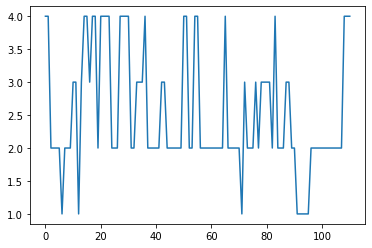

In [34]:
plt.plot(numbers2)

# 질문에서 일반인과 치매 환자 사이의 큰 차이를 보이는 범주

## 일단 평균 TOTAL 점수부터 확인

In [35]:
CN_data_question = CN_data.drop_duplicates(subset=['EMAIL'])
CN_data_question=CN_data_question[CN_data_question.columns[66:98]]
CN_data_question.reset_index(drop=True, inplace=True)
CN_data_question=CN_data_question.drop(['Q12_TOTAL'],axis=1)
CN_data_question['TOTAL']=CN_data_question.iloc[:, :-1].sum(axis=1)
CN_data_question

,Q01,Q02,Q03,Q04,Q05,Q06,Q07,Q08,Q09,Q10,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
0,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,56
1,2,2,2,2,2,2,2,1,2,2,...,2,2,2,2,2,2,2,2,2,58
2,2,2,2,2,2,2,2,1,2,2,...,2,2,2,2,2,2,2,2,2,59
3,2,2,2,1,2,2,2,2,2,2,...,2,2,2,2,2,1,2,2,2,56
4,1,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,1,2,2,2,2,2,2,2,2,2,...,2,2,1,1,2,1,2,2,2,54
81,2,2,2,2,2,2,2,2,2,1,...,2,2,2,1,2,2,2,2,2,58
82,2,2,2,2,2,2,2,2,2,2,...,2,2,2,1,2,2,2,2,2,58
83,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,60


In [36]:
# 일반인 평균 점수
CN_data_question['TOTAL'].mean()

57.588235294117645

In [37]:
MCI_data_question = MCI_data.drop_duplicates(subset=['EMAIL'])
MCI_data_question=MCI_data_question[MCI_data_question.columns[66:98]]
MCI_data_question.reset_index(drop=True, inplace=True)
MCI_data_question=MCI_data_question.drop(['Q12_TOTAL'],axis=1)
MCI_data_question['TOTAL']=MCI_data_question.iloc[:, :-1].sum(axis=1)
MCI_data_question

,Q01,Q02,Q03,Q04,Q05,Q06,Q07,Q08,Q09,Q10,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
0,1,2,2,1,2,2,2,1,2,2,...,2,2,1,1,2,2,1,2,2,47
1,2,2,2,2,2,2,2,2,2,2,...,2,2,2,1,2,2,2,2,2,58
2,2,2,2,2,2,2,2,1,2,2,...,2,2,2,2,2,2,2,2,2,58
3,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,58
4,2,2,1,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,56
5,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,57
6,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,59
7,2,2,2,1,2,2,2,2,2,2,...,2,2,2,1,2,2,2,2,2,56
8,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,59
9,2,2,2,2,2,2,2,1,2,2,...,2,2,2,2,2,1,1,2,2,54


In [38]:
# 경증 증상
MCI_data_question['TOTAL'].mean()

55.5531914893617

In [39]:
Dem_data_question = Dem_data.drop_duplicates(subset=['EMAIL'])
Dem_data_question=Dem_data_question[Dem_data_question.columns[66:98]]
Dem_data_question.reset_index(drop=True, inplace=True)
Dem_data_question=Dem_data_question.drop(['Q12_TOTAL'],axis=1)
Dem_data_question['TOTAL']=Dem_data_question.iloc[:, :-1].sum(axis=1)
Dem_data_question

,Q01,Q02,Q03,Q04,Q05,Q06,Q07,Q08,Q09,Q10,...,Q14_1,Q14_2,Q15,Q16_1,Q16_2,Q16_3,Q17,Q18,Q19,TOTAL
0,1,2,1,1,1,2,2,1,2,1,...,2,2,2,1,1,2,1,2,2,46
1,1,1,1,2,1,1,1,1,1,1,...,1,2,1,1,1,1,1,1,1,35
2,2,2,2,2,2,2,2,1,2,2,...,2,2,2,1,2,2,2,2,2,57
3,2,2,1,1,1,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,54
4,2,2,2,1,2,2,2,2,2,2,...,2,2,2,1,2,1,2,2,2,53
5,2,2,1,2,1,2,2,2,2,2,...,2,2,2,2,2,1,2,2,2,52
6,1,1,1,1,1,2,2,1,2,2,...,2,2,2,1,2,1,2,2,2,48
7,2,2,1,2,2,2,2,2,1,1,...,2,2,2,1,2,2,2,2,2,52
8,1,2,1,2,2,2,2,1,1,1,...,2,2,2,1,2,1,2,1,2,46


In [40]:
# 치매
Dem_data_question['TOTAL'].mean()

49.22222222222222

# 질문 총 점수

Text(0.5, 1.0, 'total mean score')

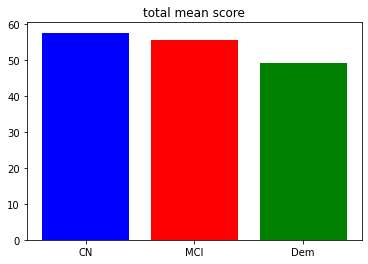

In [41]:
plt.bar(['CN','MCI','Dem'],[CN_data_question['TOTAL'].mean(),MCI_data_question['TOTAL'].mean(),Dem_data_question['TOTAL'].mean()],
       color=['blue','red','green'])
plt.title("total mean score")

In [42]:
print(CN_data_question['TOTAL'].mean(),MCI_data_question['TOTAL'].mean(),Dem_data_question['TOTAL'].mean())

57.588235294117645 55.5531914893617 49.22222222222222


# 질문 점수 재범주화

In [43]:
CN_data_question['orientation'] = CN_data_question[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].sum(axis=1)
CN_data_question['memory']=CN_data_question[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].sum(axis=1)
CN_data_question['calculate']=CN_data_question[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].sum(axis=1)
CN_data_question['language']=CN_data_question[['Q15','Q18']].sum(axis=1)
CN_data_question['handling']=CN_data_question[['Q16_1','Q16_2','Q17','Q19']].sum(axis=1)
MCI_data_question['orientation'] = MCI_data_question[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].sum(axis=1)
MCI_data_question['memory']=MCI_data_question[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].sum(axis=1)
MCI_data_question['calculate']=MCI_data_question[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].sum(axis=1)
MCI_data_question['language']=MCI_data_question[['Q15','Q18']].sum(axis=1)
MCI_data_question['handling']=MCI_data_question[['Q16_1','Q16_2','Q17','Q19']].sum(axis=1)
Dem_data_question['orientation'] = Dem_data_question[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].sum(axis=1)
Dem_data_question['memory']=Dem_data_question[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].sum(axis=1)
Dem_data_question['calculate']=Dem_data_question[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].sum(axis=1)
Dem_data_question['language']=Dem_data_question[['Q15','Q18']].sum(axis=1)
Dem_data_question['handling']=Dem_data_question[['Q16_1','Q16_2','Q17','Q19']].sum(axis=1)

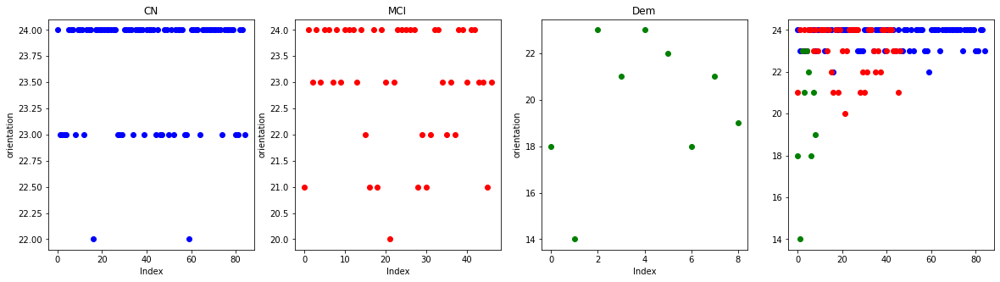

In [44]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question.index, CN_data_question['orientation'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('orientation')

axs[1].scatter(MCI_data_question.index, MCI_data_question['orientation'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('orientation')

axs[2].scatter(Dem_data_question.index, Dem_data_question['orientation'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('orientation')

plt.scatter(CN_data_question.index, CN_data_question['orientation'], color='blue')
plt.scatter(MCI_data_question.index, MCI_data_question['orientation'], color='red')
plt.scatter(Dem_data_question.index, Dem_data_question['orientation'], color='green')

plt.show()

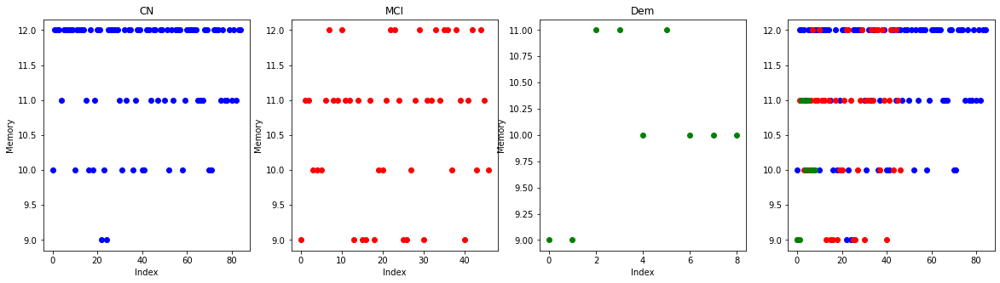

In [45]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question.index, CN_data_question['memory'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Memory')

axs[1].scatter(MCI_data_question.index, MCI_data_question['memory'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Memory')

axs[2].scatter(Dem_data_question.index, Dem_data_question['memory'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Memory')

plt.scatter(CN_data_question.index, CN_data_question['memory'], color='blue')
plt.scatter(MCI_data_question.index, MCI_data_question['memory'], color='red')
plt.scatter(Dem_data_question.index, Dem_data_question['memory'], color='green')

plt.show()

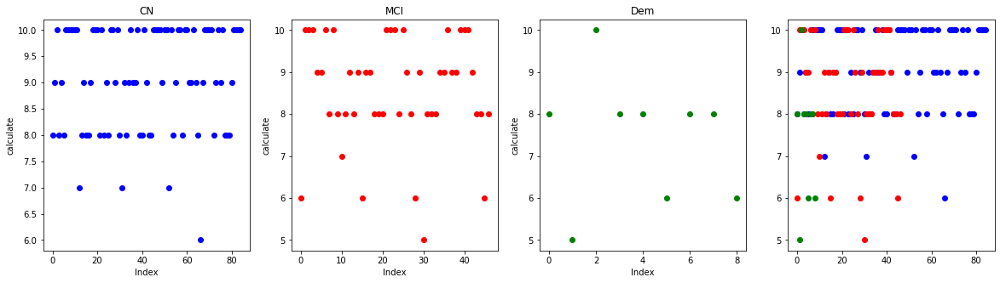

In [46]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question.index, CN_data_question['calculate'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('calculate')

axs[1].scatter(MCI_data_question.index, MCI_data_question['calculate'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('calculate')

axs[2].scatter(Dem_data_question.index, Dem_data_question['calculate'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('calculate')

plt.scatter(CN_data_question.index, CN_data_question['calculate'], color='blue')
plt.scatter(MCI_data_question.index, MCI_data_question['calculate'], color='red')
plt.scatter(Dem_data_question.index, Dem_data_question['calculate'], color='green')

plt.show()

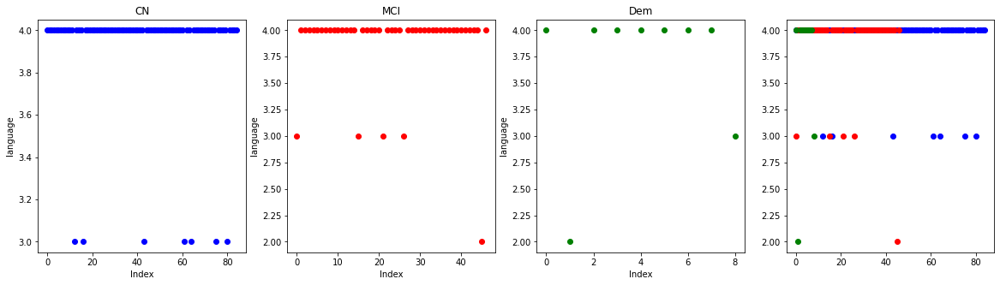

In [47]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question.index, CN_data_question['language'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('language')

axs[1].scatter(MCI_data_question.index, MCI_data_question['language'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('language')

axs[2].scatter(Dem_data_question.index, Dem_data_question['language'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('language')

plt.scatter(CN_data_question.index, CN_data_question['language'], color='blue')
plt.scatter(MCI_data_question.index, MCI_data_question['language'], color='red')
plt.scatter(Dem_data_question.index, Dem_data_question['language'], color='green')

plt.show()

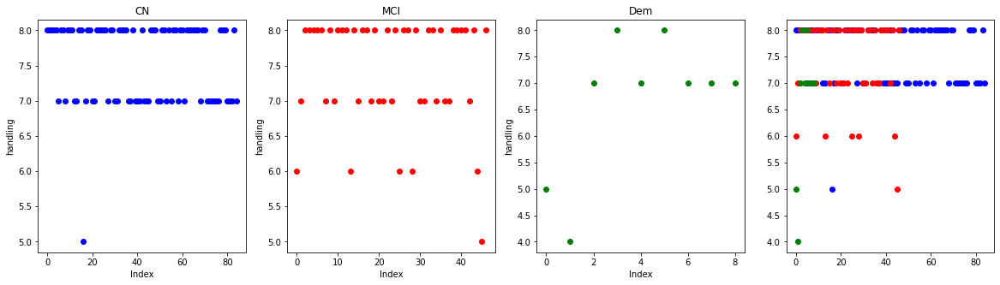

In [48]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question.index, CN_data_question['handling'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('handling')

axs[1].scatter(MCI_data_question.index, MCI_data_question['handling'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('handling')

axs[2].scatter(Dem_data_question.index, Dem_data_question['handling'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('handling')

plt.scatter(CN_data_question.index, CN_data_question['handling'], color='blue')
plt.scatter(MCI_data_question.index, MCI_data_question['handling'], color='red')
plt.scatter(Dem_data_question.index, Dem_data_question['handling'], color='green')

plt.show()

# 원래는 논문을 찾아서 치매가 걸렸을 때 가장 많이 영향을 미치는 부분에 대해서 가중치를 두려 했으나, 그런 연구 논문을 찾지 못함. 그래서 치매인 사람과 아닌 사람의 결과를 보고 가중치를 재설정하기로 함

## 그래프를 보았을 때, 차이가 큰 orientation, memory는 가중치 3, 보통 정도의 차이가 나는 calculate는 2, 별 차이가 없는 language, handling은 가중치를 1로 설정

In [49]:
CN_data_question2=CN_data_question.copy()
MCI_data_question2=MCI_data_question.copy()
Dem_data_question2=Dem_data_question.copy()

In [50]:
CN_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']] = CN_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].replace(2, 4)
CN_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']]=CN_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].replace(2,4)
CN_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']]=CN_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].replace(2,3)

MCI_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']] = MCI_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].replace(2, 4)
MCI_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']]=MCI_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].replace(2,4)
MCI_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']]=MCI_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].replace(2,3)

Dem_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']] = Dem_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].replace(2, 4)
Dem_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']]=Dem_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].replace(2,4)
Dem_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']]=Dem_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].replace(2,3)

In [51]:
CN_data_question2['TOTAL']=CN_data_question2.iloc[:, :-6].sum(axis=1)
MCI_data_question2['TOTAL']=MCI_data_question2.iloc[:, :-6].sum(axis=1)
Dem_data_question2['TOTAL']=Dem_data_question2.iloc[:, :-6].sum(axis=1)

In [52]:
CN_data_question2['orientation'] = CN_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].sum(axis=1)
CN_data_question2['memory']=CN_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].sum(axis=1)
CN_data_question2['calculate']=CN_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].sum(axis=1)
CN_data_question2['language']=CN_data_question2[['Q15','Q18']].sum(axis=1)
CN_data_question2['handling']=CN_data_question2[['Q16_1','Q16_2','Q17','Q19']].sum(axis=1)
MCI_data_question2['orientation'] = MCI_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].sum(axis=1)
MCI_data_question2['memory']=MCI_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].sum(axis=1)
MCI_data_question2['calculate']=MCI_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].sum(axis=1)
MCI_data_question2['language']=MCI_data_question2[['Q15','Q18']].sum(axis=1)
MCI_data_question2['handling']=MCI_data_question2[['Q16_1','Q16_2','Q17','Q19']].sum(axis=1)
Dem_data_question2['orientation'] = Dem_data_question2[['Q01', 'Q02', 'Q03', 'Q04', 'Q05', 'Q06', 'Q07', 'Q08', 'Q09', 'Q10', 'Q14_1', 'Q14_2']].sum(axis=1)
Dem_data_question2['memory']=Dem_data_question2[['Q11_1','Q11_2','Q11_3','Q13_1','Q13_2','Q13_3']].sum(axis=1)
Dem_data_question2['calculate']=Dem_data_question2[['Q12_1','Q12_2','Q12_3','Q12_4','Q12_5']].sum(axis=1)
Dem_data_question2['language']=Dem_data_question2[['Q15','Q18']].sum(axis=1)
Dem_data_question2['handling']=Dem_data_question2[['Q16_1','Q16_2','Q17','Q19']].sum(axis=1)

## 재범주화 후 시각화

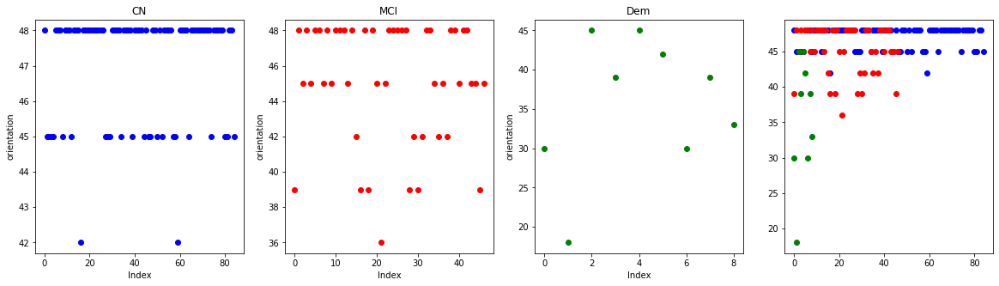

In [53]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question2.index, CN_data_question2['orientation'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('orientation')

axs[1].scatter(MCI_data_question2.index, MCI_data_question2['orientation'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('orientation')

axs[2].scatter(Dem_data_question2.index, Dem_data_question2['orientation'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('orientation')

plt.scatter(CN_data_question2.index, CN_data_question2['orientation'], color='blue')
plt.scatter(MCI_data_question2.index, MCI_data_question2['orientation'], color='red')
plt.scatter(Dem_data_question2.index, Dem_data_question2['orientation'], color='green')

plt.show()

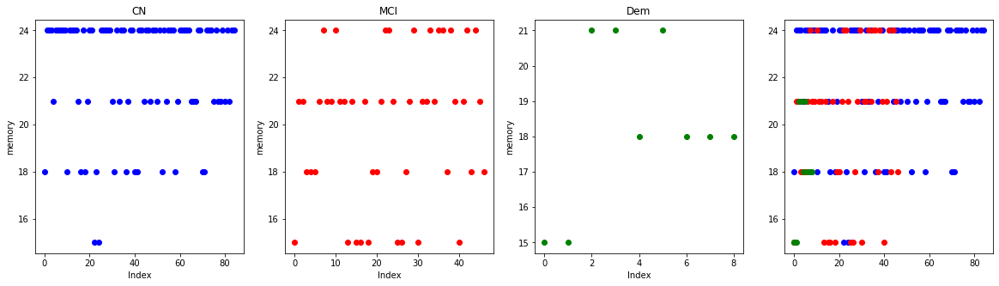

In [54]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question2.index, CN_data_question2['memory'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('memory')

axs[1].scatter(MCI_data_question2.index, MCI_data_question2['memory'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('memory')

axs[2].scatter(Dem_data_question2.index, Dem_data_question2['memory'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('memory')

plt.scatter(CN_data_question2.index, CN_data_question2['memory'], color='blue')
plt.scatter(MCI_data_question2.index, MCI_data_question2['memory'], color='red')
plt.scatter(Dem_data_question2.index, Dem_data_question2['memory'], color='green')

plt.show()

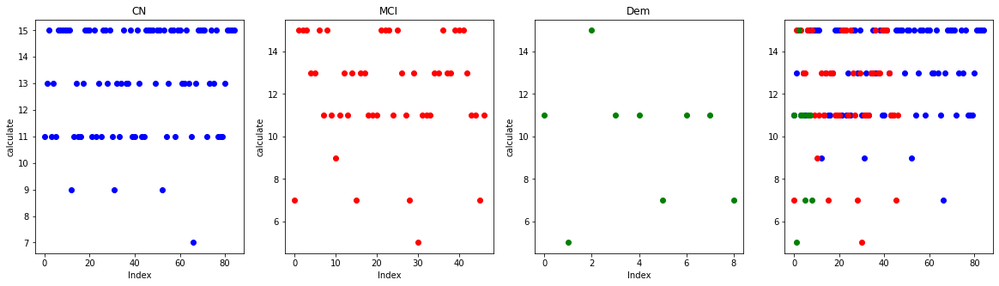

In [55]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs[0].scatter(CN_data_question2.index, CN_data_question2['calculate'], color='blue')
axs[0].set_title('CN')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('calculate')

axs[1].scatter(MCI_data_question2.index, MCI_data_question2['calculate'], color='red')
axs[1].set_title('MCI')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('calculate')

axs[2].scatter(Dem_data_question2.index, Dem_data_question2['calculate'], color='green')
axs[2].set_title('Dem')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('calculate')

plt.scatter(CN_data_question2.index, CN_data_question2['calculate'], color='blue')
plt.scatter(MCI_data_question2.index, MCI_data_question2['calculate'], color='red')
plt.scatter(Dem_data_question2.index, Dem_data_question2['calculate'], color='green')

plt.show()

Text(0.5, 1.0, 'total mean score')

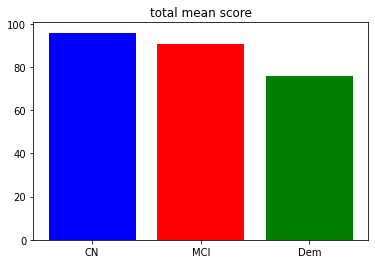

In [56]:
plt.bar(['CN','MCI','Dem'],[CN_data_question2['TOTAL'].mean(),MCI_data_question2['TOTAL'].mean(),Dem_data_question2['TOTAL'].mean()],
       color=['blue','red','green'])
plt.title("total mean score")

In [57]:
print(CN_data_question2['TOTAL'].mean(),MCI_data_question2['TOTAL'].mean(),Dem_data_question2['TOTAL'].mean())

95.84705882352941 90.53191489361703 75.66666666666667


In [58]:
CN_data_question2

,Q01,Q02,Q03,Q04,Q05,Q06,Q07,Q08,Q09,Q10,...,Q16_3,Q17,Q18,Q19,TOTAL,orientation,memory,calculate,language,handling
0,4,4,4,4,4,4,4,4,4,4,...,2,2,2,2,91,48,18,11,4,8
1,4,4,4,4,4,4,4,1,4,4,...,2,2,2,2,96,45,24,13,4,8
2,4,4,4,4,4,4,4,1,4,4,...,2,2,2,2,98,45,24,15,4,8
3,4,4,4,1,4,4,4,4,4,4,...,1,2,2,2,93,45,24,11,4,8
4,1,4,4,4,4,4,4,4,4,4,...,2,2,2,2,93,45,21,13,4,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,1,4,4,4,4,4,4,4,4,4,...,1,2,2,2,90,45,21,13,3,7
81,4,4,4,4,4,4,4,4,4,1,...,2,2,2,2,97,45,24,15,4,7
82,4,4,4,4,4,4,4,4,4,4,...,2,2,2,2,97,48,21,15,4,7
83,4,4,4,4,4,4,4,4,4,4,...,2,2,2,2,101,48,24,15,4,8
